# Analysis of the egg tempera data set collected using the conoscopic holography system
Here we analyze the egg tempera data set collected using the conoscopic holography system. In this case, the data set was exported using the micropro module to a [hdf5 dataset](https://support.hdfgroup.org/HDF5/doc1.6/UG/10_Datasets.html).

First we download the dataset from the server:


In [1]:
import gdown
url = 'https://drive.google.com/uc?id=1N-w3DlHxnB1G1E25iTPZ8HEfmhkXLa2r'
filename = 'Egg_tempera.hdf5'
gdown.download(url, filename, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1N-w3DlHxnB1G1E25iTPZ8HEfmhkXLa2r
To: /home/opdate/Desktop/Egg_tempera.hdf5
781MB [00:07, 110MB/s]  


'Egg_tempera.hdf5'

We import the module for reading hdf5 files. And we print the list of files inside the data set. 

In [2]:
import h5py
filename = 'Egg_tempera.hdf5'
with h5py.File(filename, "r") as f:
    # List all groups
    data_list = list(f.keys())

In [3]:
print(data_list)

[u'eggtem_01_t0_mpf_v1', u'eggtem_01_t1_mpf_v1', u'eggtem_01_t2_mpf_v1', u'eggtem_01_t3_mpf_v2', u'eggtem_02_t0_mpf_v1', u'eggtem_02_t1_mpf_v1', u'eggtem_02_t2_mpf_v1', u'eggtem_02_t3_mpf_v2', u'eggtem_03_t0_mpf_v1', u'eggtem_03_t1_mpf_v1', u'eggtem_03_t2_mpf_v1', u'eggtem_03_t3_mpf_v1', u'eggtem_04_t0_mpf_v1', u'eggtem_04_t1_mpf_v1', u'eggtem_04_t2_mpf_v1', u'eggtem_04_t3_mpf_v1', u'eggtem_05_t0_mpf_v1', u'eggtem_05_t1_mpf_v1', u'eggtem_05_t2_mpf_v1', u'eggtem_05_t3_mpf_v1', u'eggtem_06_t0_mpf_v1', u'eggtem_06_t1_mpf_v1', u'eggtem_06_t2_mpf_v1', u'eggtem_06_t3_mpf_v2', u'eggtem_07_t0_mpf_v1', u'eggtem_07_t0_mpf_v2', u'eggtem_07_t1_mpf_v1', u'eggtem_07_t2_mpf_v1', u'eggtem_07_t3_mpf_v1', u'eggtem_08_t0_mpf_v1', u'eggtem_08_t1_mpf_v1', u'eggtem_08_t2_mpf_v1', u'eggtem_08_t3_mpf_v1', u'eggtem_09_t0_mpf_v1', u'eggtem_09_t1_mpf_v1', u'eggtem_09_t2_mpf_v1', u'eggtem_09_t3_mpf_v2', u'eggtem_10_t0_mpf_v1', u'eggtem_10_t1_mpf_v1', u'eggtem_10_t2_mpf_v1', u'eggtem_10_t3_mpf_v1', u'eggtem_11_t0_

In [4]:
import matplotlib.pyplot as plt
from matplotlib import ticker
import numpy as np 
import gc

We read again the data:

In [5]:
data = h5py.File(filename, "r")

In [6]:
 s = data['eggtem_18_t3_mpf_v4']

Inside each entry are stored the data and the mask for each sample.

In [7]:
list(s.keys())

[u'eggtem_18_t3_mpf_v4 MASK',
 u'eggtem_18_t3_mpf_v4 SNR',
 u'eggtem_18_t3_mpf_v4 data',
 u'eggtem_18_t3_mpf_v4 photo']

In [8]:
array = data['eggtem_18_t3_mpf_v4']['eggtem_18_t3_mpf_v4 data']

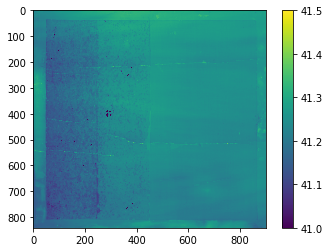

In [9]:
plt.imshow(array,vmin=41,vmax=41.5)
plt.colorbar()

In [10]:
array2 = data['eggtem_18_t0_mpf_v1']['eggtem_18_t0_mpf_v1 data']
mask = data['eggtem_18_t0_mpf_v1']['eggtem_18_t0_mpf_v1 MASK']

In [ ]:
ACQUISITION_DATE

We define a functio for extracting the ata of a sample at a specific step:

In [11]:
def get_surface_name(id,time):
  # we pad with 0 the id
  id = str(id).zfill(2)
  name = [i for i in data_list if "_%s_"%id in i and "_t%s_"%time in i]
  if len(name) == 0:
    ValueError("No surface found with this ID and time")
  return name[0]

In [12]:
def get_surface_photo(id):
  name = get_surface_name(id,0)
  photo = data[name]['%s photo'%name]
  return np.array(photo)

In [13]:
def get_surface_array(id,time):
  name = get_surface_name(id,time)
  array = data[name]['%s data'%name]
  mask = data[name]['%s MASK'%name]
  d = np.ma.array(array,mask=mask)
  return d


In [44]:
def get_surface_corners(id,time):
  name = get_surface_name(id,time)
  corners = data[name]['%s data'%name].attrs['detected_corners']
  return corners.reshape((4,2))

We test the function extracting the sample 18 at step 0.

In [14]:
arr = get_surface_array(18,0)

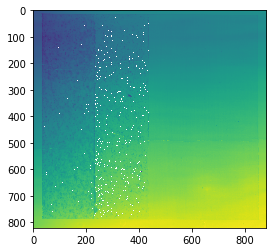

In [15]:
plt.imshow(arr)

We define a function for subtracting the best plane that fits the unmaked data:

In [16]:
def subtractplane(array,order=1):
  import scipy.linalg
  # regular grid covering the domain of the data Xr, Yr are undersampled
  # plane  to be plot faster
  X, Y = np.meshgrid(
      np.arange(
          0, array.shape[1], 1), np.arange(
          0, array.shape[0], 1))

  if hasattr(array, 'mask'):
      if array.mask.size !=1:
          # The masked values have to be extracted manually processing masked array will not
          # avoid computation over masked values
          x = X[~array.mask].flatten()
          y = Y[~array.mask].flatten()
          z = array[~array.mask].data.flatten()

      else:
          x = X.flatten()
          y = Y.flatten()
          z = array.flatten()

  else:
      x = X.flatten()
      y = Y.flatten()
      z = array.flatten()

  if order == 1:
      # best-fit linear plane
      A = np.c_[x, y, np.ones(len(x))]
      C, _, _, _ = scipy.linalg.lstsq(A, z)    # coefficients
      # evaluate it on grid
      Z = C[0] * X + C[1] * Y + C[2]
  if hasattr(array, 'mask'):
    if array.mask.size !=1:
      result = Z - array.data
      result = np.ma.array(data=result,mask=array.mask)
  else:
    result= Z - array
  return result

We test the function:

In [17]:
arrsub = subtractplane(arr)

In [18]:
type(arrsub)

numpy.ma.core.MaskedArray

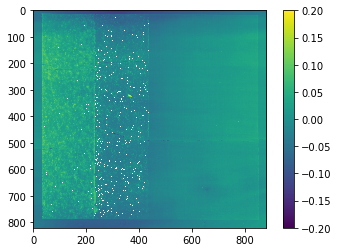

In [19]:
plt.imshow(arrsub,vmin=-0.2,vmax=0.2)
plt.colorbar()

In [75]:
sID = 2
stage_step = 0.05
def compare_samples(sID,stage_step,scale='min-max',show_photo=False,show_corners=False,save=False):
  fig = plt.figure(figsize=(12,2.5))
  fig.suptitle("ID: %s" %sID)
  axs = dict()
  arrs = [subtractplane(get_surface_array(sID,i)) for i in range(4)]
  #fmin =  np.hstack([np.hstack(i) for i in arrs])
  if scale == 'min-max':
    vmin = np.min([np.min(i) for i in arrs])
    vmax = np.max([np.max(i) for i in arrs])
  else:
    std = np.max([np.std(i) for i in arrs])
    vmin = -std*1.2
    vmax = std*1.2
  photo = 0
  if show_photo:
    photo = 11
  for i in range(4):
    axs[i] = fig.add_subplot(141+i+photo)
    sub_arr = arrs[i]
    mesh = axs[i].imshow(sub_arr.data,vmin=vmin,vmax=vmax)
    xticks = ticker.FuncFormatter(
                    lambda x, pos: '{0:g}'.format(
                        x * stage_step))
    yticks = xticks
    axs[i].xaxis.set_major_formatter(xticks)
    axs[i].yaxis.set_major_formatter(yticks)
    axs[i].set_xlabel(
        '(mm)')
    axs[i].set_title("t %s" %i)
    if show_corners: 
        corners = get_surface_corners(sID,i)
        axs[i].scatter(corners[:,0],corners[:,1])
  if show_photo:
    axs[4] = fig.add_subplot(151)
    axs[4].imshow(get_surface_photo(sID))
    axs[4].axes.get_xaxis().set_visible(False)
    axs[4].axes.get_yaxis().set_visible(False)
  axs[0].set_ylabel('(mm)')
  fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.82,
                      wspace=0.2, hspace=0.1)
  cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
  zticks = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x * 1000))
  cbar = fig.colorbar(mesh,format=zticks,cax=cb_ax)
  cbar.set_label('Height difference($\mu m$)')
  plt.subplots_adjust(wspace=0.2, hspace=0)
  if save:
      plt.savefig("%s.pdf"%sID,bbox_inches = 'tight',
        pad_inches = 0)

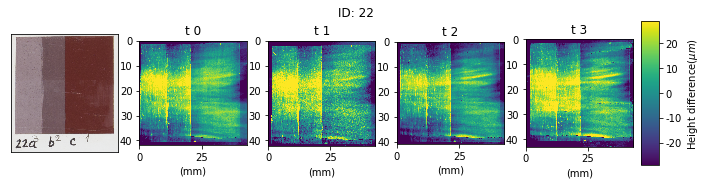

In [76]:
compare_samples(22,0.05,scale='std',show_photo=True)

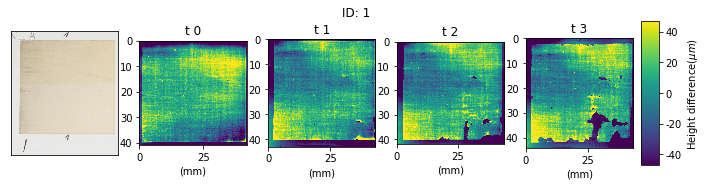

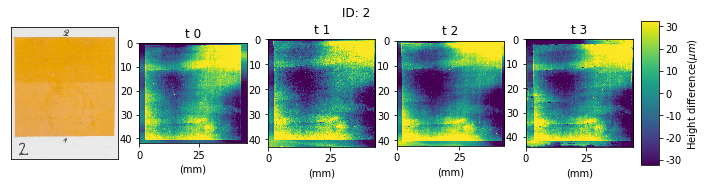

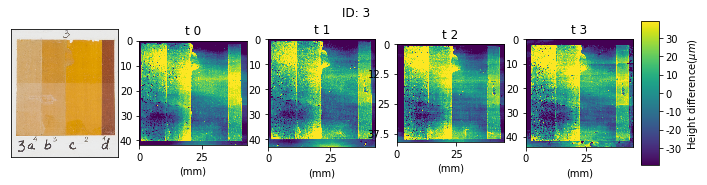

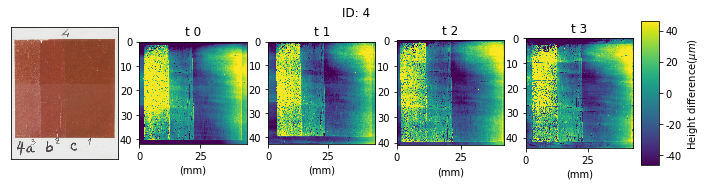

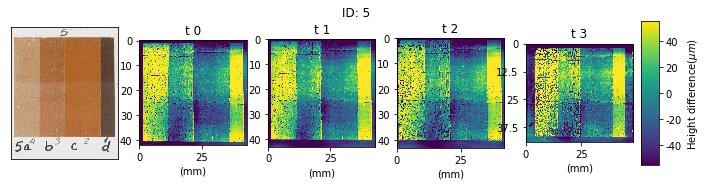

...

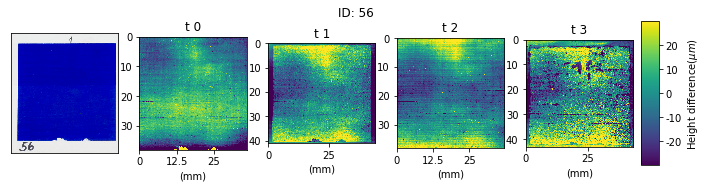

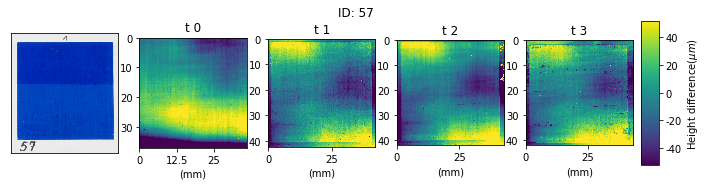

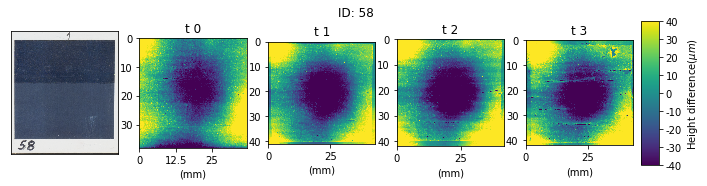

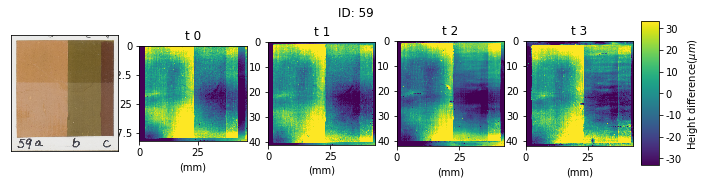

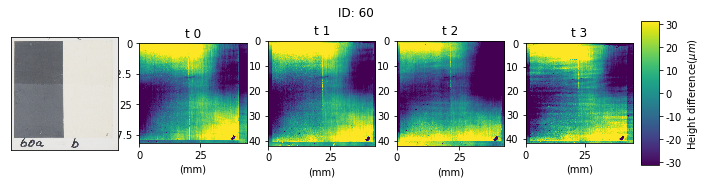

In [77]:
%matplotlib inline
for i in range(1,61):
  compare_samples(i,0.05,scale='std',show_photo=True,save=True)

In [118]:
res = np.concatenate([x.ravel() for x in myarrs2])


In [119]:
res

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   0,   1,   2,   3,
         4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,
        17,  18,  19,  20,  21,  22,  23,  24,   0,   1,   2,   3,   0,
         1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124])

In [32]:
%matplotlib
compare_samples(10,0.05,scale='std',show_photo=True)

Using matplotlib backend: TkAgg
